In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import libs.
import math
import torch
import torchvision
import torch.nn as nn
import requests
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import itertools

import io, os, json, cv2, random
from google.colab.patches import cv2_imshow

In [ ]:
# Download detectron2 envi and pyyaml to config.
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

!pip install pyyaml==5.1

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


## Download and save pre-trained model

In [ ]:
# Pretrained Model Transformer for object detection.
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained = True)
model.eval();

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_master


In [ ]:
# DETR Architecture
model

# Both Encoder and Decoder use 6 stacks of composed modules, the leading module is Multihead Attention.
# We can also see the ResNet-50 architecture employs both bottle-neck and skip connection.

DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
       

In [ ]:
# Import image. 
url = input('Feed me the image from URL: ')

Feed me the image from URL: https://cdn.lifestyleasia.com/wp-content/uploads/sites/6/2020/08/21194817/kim-k-splash-news-1351x900.jpg


In [ ]:
img = Image.open(requests.get(url, stream=True).raw)
img.size

(1351, 900)

**Example Image**

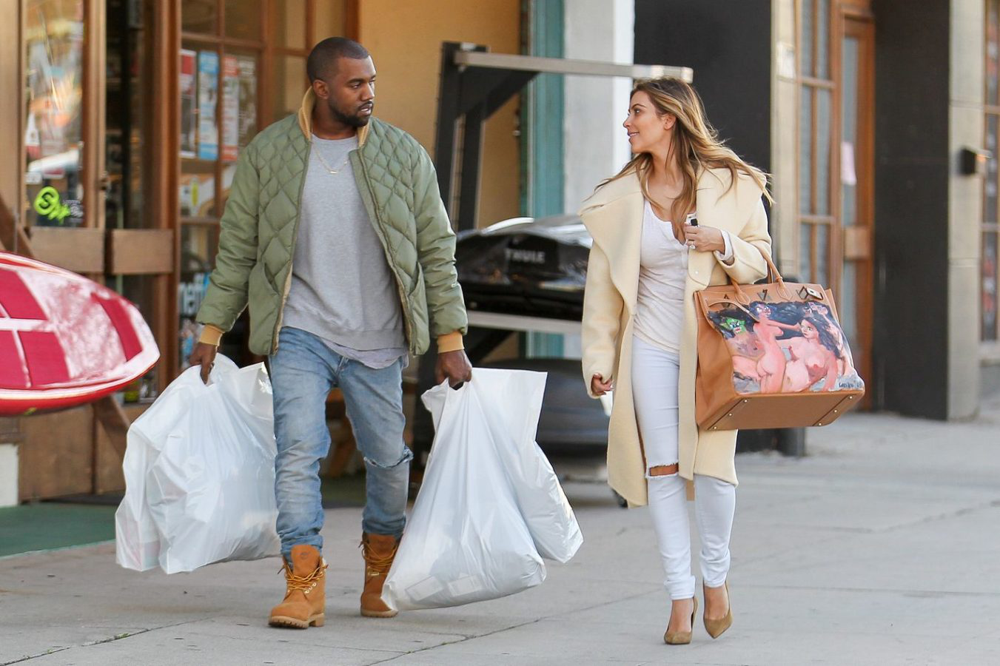

In [ ]:
img

In [ ]:
# Resize the image into 800x800 and normalize each pixel of each channel with mean and std (out = (in-mean)/std). 
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])
])

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

# DETR uses format: [xcenter,ycenter,w,h], we convert to [x_min,y_ymin,x_max,y_max]
def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [ ]:
def detect(im, model, transform):
    # Resize.
    img = transform(im).unsqueeze(0)

    assert img.shape[-2] <= 2000 and img.shape[-1] <= 2000, 'demo model only supports images up to 2000 pixels on each side'

    # Propagate through layers
    outputs = model(img)

    # confidence higher than > 0.8
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.8

    # Output are scaled bboxes 
    bboxes = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    return keep, probas[keep], bboxes

In [ ]:
# Use hook for storing info through propagation process.

# conv_features: feature maps through model. 
# enc_attn_weights: attention weight (W^Q, W^K, W^V) of Encoder.
# dec_attn_weights: attention weight (W^Q, W^K, W^V) of Decoder.


conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
    model.backbone[-2].register_forward_hook(
        lambda self, input, output: conv_features.append(output)
    ),
    model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        lambda self, input, output: enc_attn_weights.append(output[1])
    ),
    model.transformer.decoder.layers[-1].multihead_attn.register_forward_hook(
        lambda self, input, output: dec_attn_weights.append(output[1])
    ),
]

In [ ]:
keep, scores, boxes = detect(img, model, transform)

In [ ]:
# Boxes
boxes

tensor([[9.5176e+02, 4.0775e+02, 1.0232e+03, 4.5760e+02],
        [9.3464e+02, 3.1386e+02, 1.1704e+03, 5.6509e+02],
        [2.5056e+02, 4.7322e+01, 6.3615e+02, 8.4608e+02],
        [5.8600e-01, 3.3447e+02, 2.2421e+02, 5.6059e+02],
        [5.0943e+02, 4.9927e+02, 7.9064e+02, 8.2569e+02],
        [7.7973e+02, 1.0242e+02, 1.0555e+03, 8.7016e+02],
        [9.3179e+02, 2.9127e+02, 9.4981e+02, 3.0713e+02]])

In [ ]:
# Define colors
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]


# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

In [ ]:
# Plot image and predicted bboxes
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Object detection result 

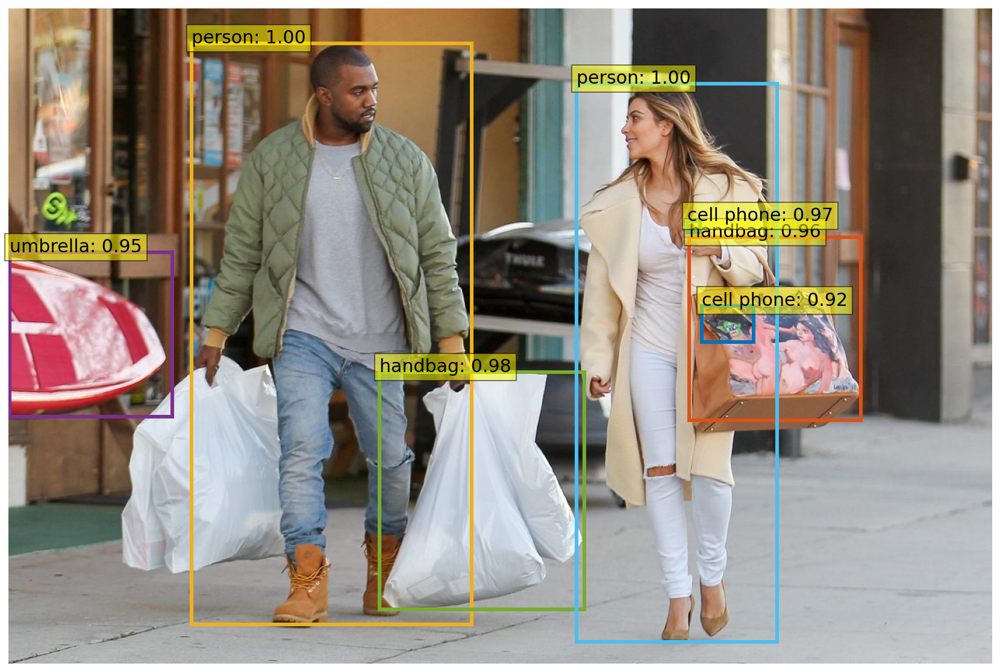

In [ ]:
plot_results(img, scores, boxes)

## Mutli-head attention Visualization

In [ ]:
for hook in hooks:
    hook.remove()

conv_features = conv_features[0]
enc_attn_weights = enc_attn_weights[0]
dec_attn_weights = dec_attn_weights[0]

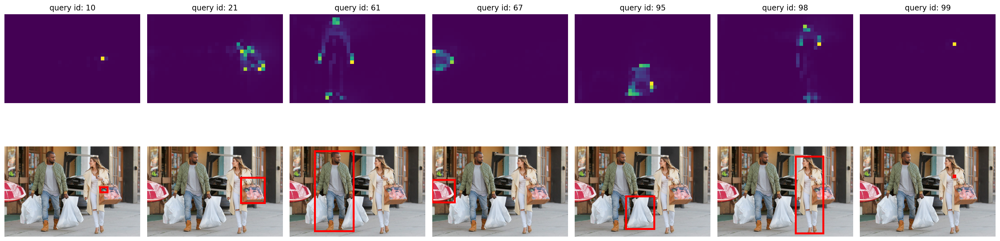

In [ ]:
# Visualize object queries on feature map (hxw).  
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(boxes), nrows=2, figsize=(22, 7))
colors = COLORS * 100

for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, boxes):
    ax = ax_i[0]
    ax.imshow(dec_attn_weights[0, idx].view(h, w).detach().numpy())
    ax.axis('off')
    ax.set_title(f'query id: {idx.item()}')
    ax = ax_i[1]
    ax.imshow(img)
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='red', linewidth=3))
    ax.axis('off')
    # ax.set_title(CLASSES[scores[idx].argmax()])


fig.tight_layout()

## Self attention Visualization

In [ ]:
# Shape of Encoder attention (h*w, h*w) and Feature map (1, d, h, w) of the image after CNN propagate.
f_map = conv_features['0']
print("Encoder attention:      ", enc_attn_weights[0].shape)
print("Feature map:            ", f_map.tensors.shape)

Encoder attention:       torch.Size([950, 950])
Feature map:             torch.Size([1, 2048, 25, 38])


In [ ]:
# Lấy shape h và w của feature map
shape = f_map.tensors.shape[-2:]

# Re-config the shape of self-attention map to (h,w,h,w)
sattn = enc_attn_weights[0].reshape(shape + shape)
print("Reshaped self-attention:", sattn.shape)

Reshaped self-attention: torch.Size([25, 45, 25, 45])


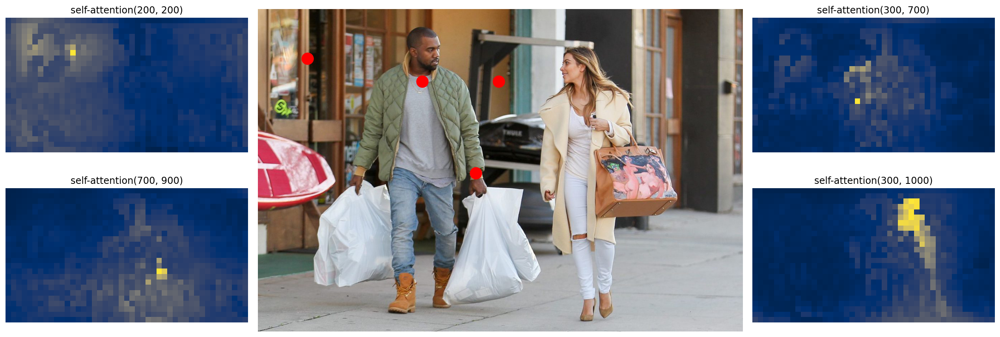

In [ ]:
# Size of reference points.
fact = 32

# Define the location of 4 reference points.
idxs = [(200, 200), (700, 900), (300, 700), (300, 1000),]

fig = plt.figure(constrained_layout=True, figsize=(25 * 0.7, 8.5 * 0.7))

# Plot points.
gs = fig.add_gridspec(2, 4)
axs = [
    fig.add_subplot(gs[0, 0]),
    fig.add_subplot(gs[1, 0]),
    fig.add_subplot(gs[0, -1]),
    fig.add_subplot(gs[1, -1]),
]

# Plot self-attention for each point
for idx_o, ax in zip(idxs, axs):
    idx = (idx_o[0] // fact, idx_o[1] // fact)
    ax.imshow(sattn[..., idx[0], idx[1]].detach().numpy(), cmap='cividis', interpolation='nearest')
    ax.axis('off')
    ax.set_title(f'self-attention{idx_o}')

# Og image with red dot and for self attention of reference points.
fcenter_ax = fig.add_subplot(gs[:, 1:-1])
fcenter_ax.imshow(img)
for (y, x) in idxs:
    scale = img.height / img.size[-2]
    x = ((x // fact) + 0.5) * fact
    y = ((y // fact) + 0.5) * fact
    fcenter_ax.add_patch(plt.Circle((x * scale, y * scale), fact // 2, color='r'))
    fcenter_ax.axis('off')

## Panoptic Segmentation Visualization

In [ ]:
# Install pretrained model (panoptic model = Transformer + panoptic head)
model, postprocessor = torch.hub.load('facebookresearch/detr', 'detr_resnet101_panoptic', pretrained=True, return_postprocessor=True, num_classes=250)
model.eval();

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_master


In [ ]:
# Install coco's panopticapi.
!pip install git+https://github.com/cocodataset/panopticapi.git
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

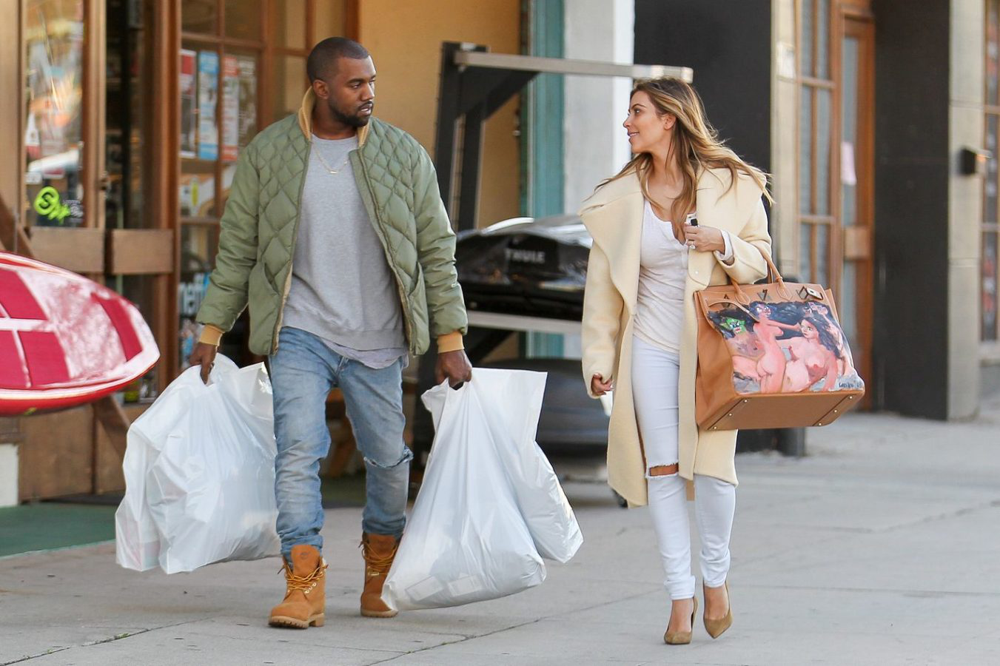

In [ ]:
img

### Plot binary masks

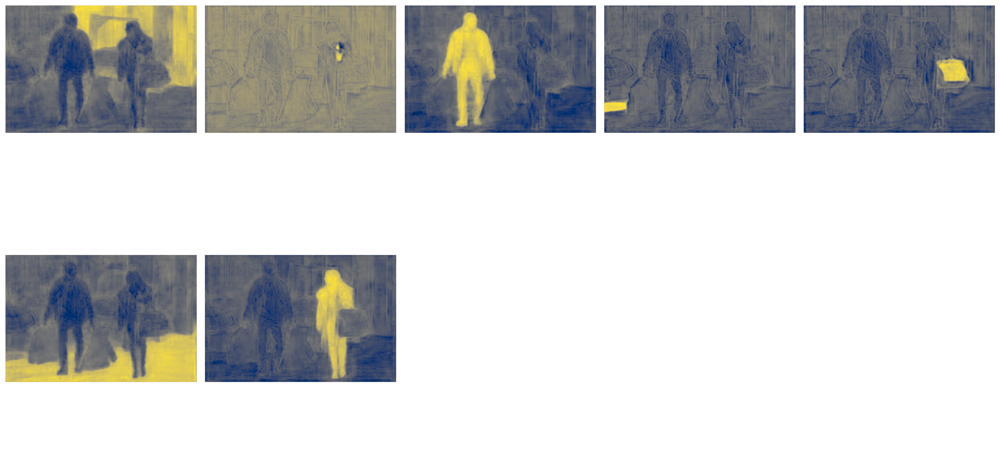

In [ ]:
# Detect object 
img = transform(img).unsqueeze(0)
out = model(img)

# Calculate confident score, skip no-obj class and keep predictions have confidence over 85%.
scores = out["pred_logits"].softmax(-1)[...,:-1].max(-1)[0]
keep = scores > 0.85

# Plot binary masks.
# Binary masks is visualized from the last layer of FPN, which convey high-level feature.
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))

for line in axs:
    for a in line:
        a.axis('off')

for i, mask in enumerate(out["pred_masks"][keep]):
    ax = axs[i // ncols, i % ncols]
    ax.imshow(mask.detach().numpy(), cmap="cividis")
    ax.axis('off')
fig.tight_layout()

### Draw segmentation

In [ ]:
# Draw segmentation. 
import seaborn as sns
from torchvision.models import resnet50
torch.set_grad_enabled(False);

%config InlineBackend.figure_format = 'retina'

import panopticapi
from panopticapi.utils import id2rgb, rgb2id

In [ ]:
# Shape của ảnh output là shape của ảnh đầu vào.
result = postprocessor(out, torch.as_tensor(img.shape[-2:]).unsqueeze(0))[0]

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


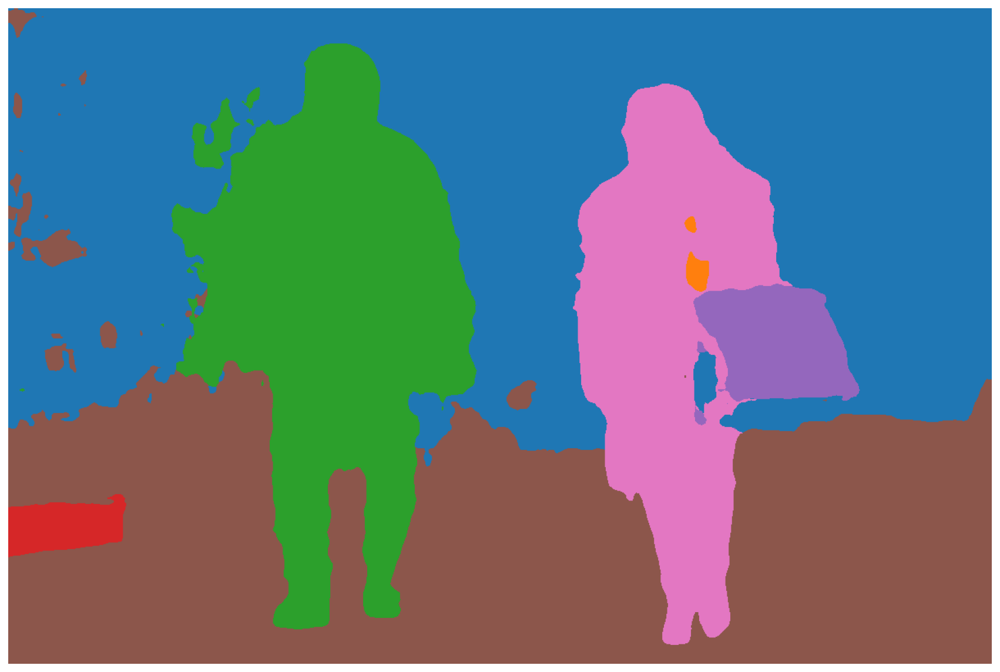

In [ ]:
palette = itertools.cycle(sns.color_palette())

panoptic_seg = Image.open(io.BytesIO(result['png_string']))
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8).copy()

# Each predicted object is assigned an id
# And colored differently.
panoptic_seg_id = rgb2id(panoptic_seg)

panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
  panoptic_seg[panoptic_seg_id == id] = numpy.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg)
plt.axis('off')
plt.show()

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [ ]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from google.colab.patches import cv2_imshow

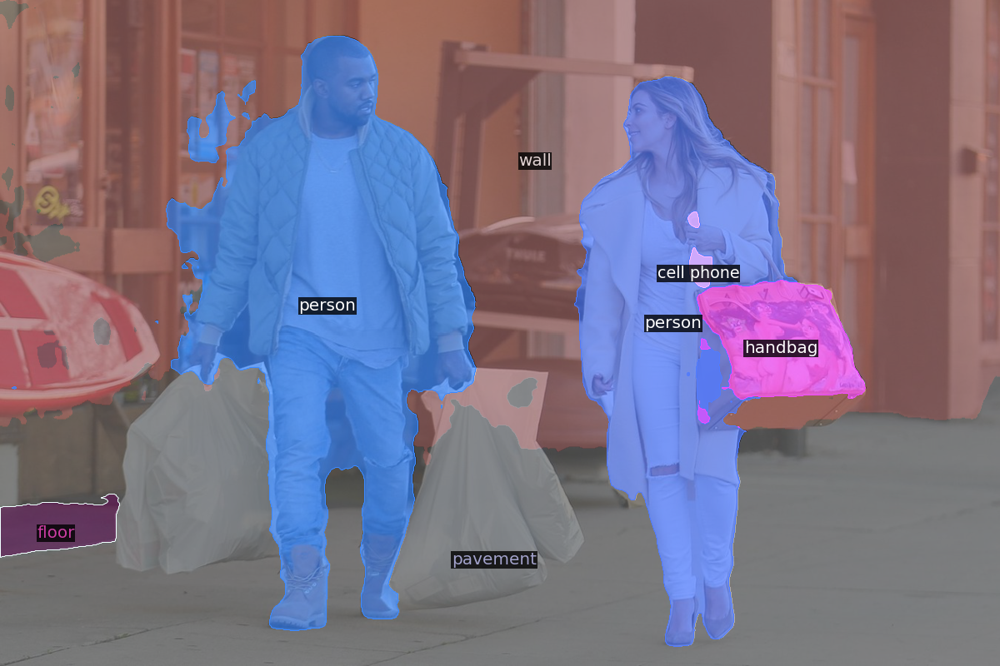

In [ ]:
from copy import deepcopy
# We extract the segments info and the panoptic result from DETR's prediction.
segments_info = deepcopy(result["segments_info"])
# Panoptic predictions are stored in a special format png.
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map.
panoptic_seg = numpy.array(panoptic_seg, dtype=numpy.uint8)
panoptic_seg = torch.from_numpy(rgb2id(panoptic_seg))

    
# Convert id to label of COCO dataset.
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]


# Visualize last result.
v = Visualizer(np.array(img.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=1)
cv2_imshow(v.get_image())